# Cross-over errors

In [8]:
# %load_ext autoreload
# %autoreload 2


import logging

import geopandas as gpd
import numpy as np
import pandas as pd
import plotly.io as pio

import airbornegeo

# setup logging to get some additional info from the airbornegeo functions
logging.getLogger("airbornegeo").setLevel("INFO")
logging.basicConfig()
pio.renderers.default = "notebook"

## Load data

This is a subset of the BAS AGAP survey over Antarctica's Gamburtsev Subglacial Mountains. The file is download and subset in the notebook `AGAP_magnetic_survey`, and the BAS processing steps are repeated in the notebook `processing_AGAP_magnetic_survey`.

In [9]:
data_df = pd.read_csv("data/AGAP_magnetic_survey_processed_blocked.csv")
data_df = data_df[
    [
        "easting",
        "northing",
        "height",
        "line",
        "unixtime",
        "distance_along_line",
        "mag",
    ]
]

# for testing limit number of lines
data_df = data_df[~data_df.line.between(133, 142)]
data_df = data_df[~data_df.line.between(168, 176)]
data_df = data_df[
    (data_df.line.isin(data_df.line.unique()[::2])) | (data_df.line >= 143)
]

# define flight lines vs tie lines
data_df["line_type"] = np.where(data_df.line >= 142, "tie", "line")

data_df.head()

,easting,northing,height,line,unixtime,distance_along_line,mag,line_type
0,621152.853769,159064.167598,4112.55,1,1.229500e+09,81.451091,-34.245,line
1,621367.339673,159092.051982,4119.45,1,1.229500e+09,297.742539,-37.740,line
2,621580.287957,159122.206492,4124.15,1,1.229500e+09,512.819231,-40.975,line
3,621766.100699,159150.747140,4127.50,1,1.229500e+09,700.811387,-43.430,line
4,621924.954435,159176.326498,4131.00,1,1.229500e+09,861.711758,-45.300,line


In [13]:
data_df[data_df.line_type == "line"].line.sort_values().unique()

array([  1,   3,   5,   7,   9,  11,  13,  15,  17,  19,  21,  23,  25,
        27,  29,  31,  33,  35,  37,  39,  41,  43,  45,  47,  49,  51,
        53,  55,  57,  59,  61,  63,  65,  67,  69,  71,  73,  75,  77,
        79,  81,  83,  85,  87,  89,  91,  93,  95,  97,  99, 101, 103,
       105, 107, 109, 111, 113, 115, 117, 119, 121, 123, 125, 127, 129,
       131])

In [14]:
data_df[data_df.line_type == "tie"].line.sort_values().unique()

array([143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 177,
       178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190,
       191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203,
       204, 205, 206])

In [15]:
airbornegeo.plotly_points(
    data_df,
    color_col="line",
    hover_cols=["distance_along_line"],
)

## Find intersections

In [16]:
# convert dataframe into geodataframe
data_df = gpd.GeoDataFrame(
    data_df,
    geometry=gpd.points_from_xy(data_df.easting, data_df.northing),
    crs="EPSG:3031",
)

Line/tie combinations:   0%|          | 0/3630 [00:00<?, ?it/s]

Potential intersections:   0%|          | 0/664 [00:00<?, ?it/s]

INFO:airbornegeo:found 662 intersections


,line,tie,geometry,max_dist,easting,northing
0,1,143,POINT (1158153 254083),73.980331,1158153.0,254083.0
1,1,144,POINT (1190820 259865),91.228123,1190820.0,259865.0
2,1,145,POINT (1223524 265689),77.978287,1223524.0,265689.0
3,1,146,POINT (1256193 271497),62.334186,1256193.0,271497.0
4,1,147,POINT (1288902 277249),99.009111,1288902.0,277249.0
...,...,...,...,...,...,...
657,125,199,POINT (1318165 302398),94.337200,1318165.0,302398.0
658,125,200,POINT (1350929 308239),36.343660,1350929.0,308239.0
659,127,148,POINT (1319894 292699),91.137825,1319894.0,292699.0
660,127,199,POINT (1319921 292702),74.568340,1319921.0,292702.0


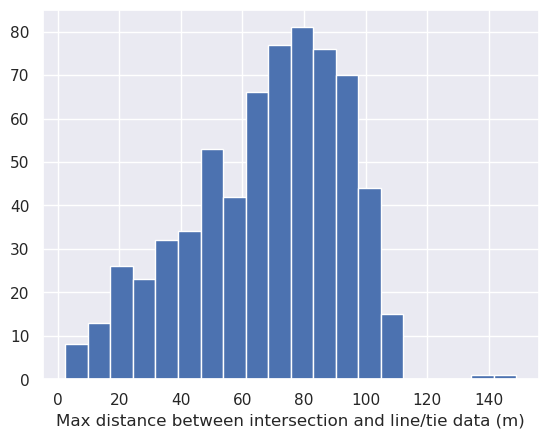

In [17]:
# calculate theoretical intersection points
inters = airbornegeo.create_intersection_table(data_df)
inters

## Add intersections as rows to the dataframe
We can now add a row to each line of the dataframe which represents the intersection point. We don't know the data values for the intersection point, so we will also need to interpolate the data from the line data on either side of the intersection. We can specify the interpolation type ('linear', 'nearest', 'quadratic', 'cubic' etc.) and a window width of data to use for the interpolation in meters. We also specify which column we want to be interpolated (the magnetic data). 

If the window width is not wide enough to capture data on either side, it will be doubled twice to try and capture enough data. If it still too narrow to capture data on either side, the intersection point will either be dropped, or if `extrapolate` is set to true, the values will be filled with extrapolation, instead of interpolation. This extrapolation is also necessary if the intersections lie beyond the end of a line, which occurs if you used the `buffer_dist` argument for `create_intersection_table`.

```
 - : data
 x : intersection point
[ ]: data windows for interpolation
- - - - - - -          x         - - - - - - 
                    [     ] # first window
                 [           ] # doubled once
            [                     ] # doubled twice
```

In [18]:
data_df, inters = airbornegeo.interpolate_intersections(
    data_df,
    inters,
    to_interp="mag",
    window_width=500,
    method="cubic",
    extrapolate=False,
)

Segments:   0%|          | 0/121 [00:00<?, ?it/s]

In [19]:
inters.head()

,line,tie,geometry,max_dist,easting,northing,dist_along_flight_line,dist_along_flight_tie,flight_interpolation_type,tie_interpolation_type
0,1,143,POINT (1158153 254083),73.980331,1158153.0,254083.0,545768.070745,138071.419338,interpolated,interpolated
1,1,144,POINT (1190820 259865),91.228123,1190820.0,259865.0,578952.394848,131585.124971,interpolated,interpolated
2,1,145,POINT (1223524 265689),77.978287,1223524.0,265689.0,612181.969027,147253.495479,interpolated,interpolated
3,1,146,POINT (1256193 271497),62.334186,1256193.0,271497.0,645372.035002,136211.666612,interpolated,interpolated
4,1,147,POINT (1288902 277249),99.009111,1288902.0,277249.0,678599.158436,155115.067538,interpolated,interpolated


In [20]:
data_df[data_df.is_intersection].head()

,easting,northing,height,line,unixtime,distance_along_line,mag,line_type,geometry,is_intersection,intersecting_line,mag_interpolation_type
3728,637640.0,161826.0,NaN,1,NaN,16811.101709,-53.846491,NaN,POINT (637640 161826),True,150.0,interpolated
3729,670007.0,167673.0,NaN,1,NaN,49821.819833,-80.383052,NaN,POINT (670007 167673),True,151.0,interpolated
3730,702402.0,173414.0,NaN,1,NaN,82726.338399,-44.551908,NaN,POINT (702402 173414),True,152.0,interpolated
3731,702429.0,173419.0,NaN,1,NaN,82753.792214,-44.794655,NaN,POINT (702429 173419),True,153.0,interpolated
3732,734809.0,179103.0,NaN,1,NaN,115638.011691,-120.194334,NaN,POINT (734809 179103),True,154.0,interpolated


In [21]:
# see which lines dont have intersections
airbornegeo.lines_without_intersections(data_df, inters)

[np.int64(107),
 np.int64(109),
 np.int64(129),
 np.int64(131),
 np.int64(188),
 np.int64(189),
 np.int64(190),
 np.int64(192),
 np.int64(193),
 np.int64(194),
 np.int64(203)]

## Inspect the intersections
The below two cells allow you to look at a line in profile view and see it's intersections. We pass the column 'mag' to be plotted on the y axis, and distance along line on the x axis. The small dots, which form lines since they are close together, show the magnetic data of the line. The diamonds show the intersection points. The diamonds are plotted with the y axis values of the intersecting line. If the diamond if vertically offset from the points, that means the intersecting line's magnetic value at the intersection is quite different. This shows the cross-over errors. For example, in the below plot, the lines 85 and 77 have quite large cross-over erros with the plotted line, 161.

In [22]:
# # if you want to individually inspect each line and its intersections
# airbornegeo.inspect_intersections(
#     data_df,
#     plot_variable=["mag"],
#     # plot_all=True,
# )

In [23]:
# if you want to just look at 1 line
airbornegeo.plot_line_and_crosses(
    data_df,
    line=161,
    x="distance_along_line",
    y=["mag"],
    y_axes=[1],
    plot_inters=True,
)

## Calculate intersection cross-over errors
Now we have interpolated magnetic values for each intersecting line at the intersection points, we can calculate the cross-over errors for each intersection

Intersections:   0%|          | 0/662 [00:00<?, ?it/s]

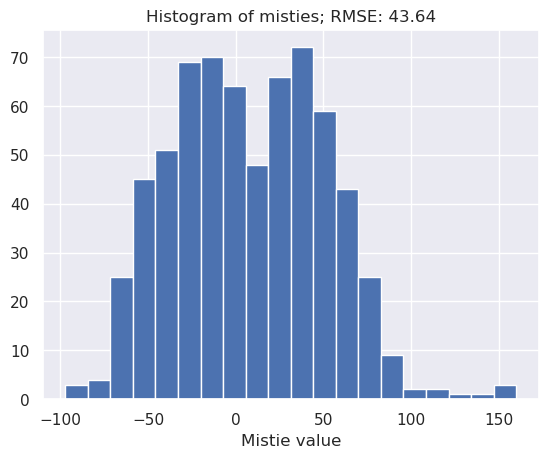

In [24]:
inters = airbornegeo.calculate_crossover_errors(
    data_df,
    inters,
    data_col="mag",
    plot_map=True,
)

In [25]:
inters.head()

,line,tie,geometry,max_dist,easting,northing,dist_along_flight_line,dist_along_flight_tie,flight_interpolation_type,tie_interpolation_type,mistie_0
0,1,143,POINT (1158153 254083),73.980331,1158153.0,254083.0,545768.070745,138071.419338,interpolated,interpolated,100.457110
1,1,144,POINT (1190820 259865),91.228123,1190820.0,259865.0,578952.394848,131585.124971,interpolated,interpolated,32.156634
2,1,145,POINT (1223524 265689),77.978287,1223524.0,265689.0,612181.969027,147253.495479,interpolated,interpolated,72.942420
3,1,146,POINT (1256193 271497),62.334186,1256193.0,271497.0,645372.035002,136211.666612,interpolated,interpolated,84.125597
4,1,147,POINT (1288902 277249),99.009111,1288902.0,277249.0,678599.158436,155115.067538,interpolated,interpolated,-7.733598
